In [1]:
import numpy as np
from matplotlib import pyplot as plt

from astropy.io import fits
import photutils

%matplotlib inline
#%config InlineBackend.figure_format='retina'
#!pip install git+https://github.com/M-Bianchi/My_matplotlib_style
#plt.style.use('mystyle')
#plt.rcParams['axes.grid'] = False

In [2]:
# Function to open the fits file and plot them
def Open_Fits(filepath, plot):
    file_temp = fits.open(filepath)
    file = file_temp[0].data
    file_temp.close()
    if plot == True:
        plt.imshow(file, clim=np.quantile(file, [0.01, 0.99]), cmap='gnuplot2', origin='lower')
        plt.colorbar(fraction=0.0375, pad=0.02);
    return file

### Removing the sky

In [3]:
# Function to manually select a sensible threshold for masking astrophysical sources in the image
def Select_Threshold(image, threshold, bins):
    # We set the sources to zero in order to identify the mask in the image 
    image_masked = image.copy()
    image_masked[image > threshold] = 0
    
    # Plot the results
    fig, axes = plt.subplots(1, 2, figsize=(18, 7))
    ax = axes[0]
    ax.hist(image.flatten(), bins=bins, histtype='step');
    ax.axvline(threshold, color='k', linestyle='--', label=f'threshold = {threshold:.3f}')
    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.legend()
    
    ax = axes[1]
    img = ax.imshow(image_masked, clim=np.quantile(image_masked, [0.01, 0.99]), cmap='gnuplot2', origin='lower')
    cax = fig.add_axes([0.905, 0.132, 0.015, 0.725])
    fig.colorbar(img, cax=cax);
    
    return fig, axes

In [4]:
# Function to cover the nebula with a circular mask
def Create_Circular_Mask(image, h, w, center, radius, mask=None):
    Y, X = np.ogrid[:h, :w]
    dist_from_center = np.sqrt((X - center[0])**2 + (Y-center[1])**2)

    mask_circ = dist_from_center <= radius
    
    # Plot the results
    circle = plt.Circle(center, radius, color='black', fill=False)

    fig, axes = plt.subplots(1, 2, figsize=(21, 7))
    ax = axes[0]
    img = ax.imshow(image, clim=np.quantile(image, [0.01, 0.99]), cmap='gnuplot2', origin='lower')
    cax = fig.add_axes([0.465, 0.11, 0.015, 0.77])
    fig.colorbar(img, cax=cax)
    ax.add_patch(circle)

    ax = axes[1]
    if mask is None: mask_tot = mask_circ
    else: mask_tot = np.logical_or(mask, mask_circ)
    img = ax.imshow(np.where(mask_tot, 0, image), clim=np.quantile(np.where(mask_tot, 0, image), [0.01, 0.99]), cmap='gnuplot2', origin='lower')
    cax = fig.add_axes([0.887, 0.11, 0.015, 0.77])
    fig.colorbar(img, cax=cax);
    
    return mask_circ

In [5]:
# Function to remove the sky background from the image
# https://eteq.github.io/notebooks-for-all/Imaging_Sky_Background_Estimation.html

from astropy import stats as astrostats
from photutils.background import (Background2D, MedianBackground)  # For estimating the background
from photutils.background import BkgZoomInterpolator               # For interpolating the background

def Remove_Bkg(image, mask, box_size=(50,50), filter_size=(3,3), exclude_percentile=30):
    
    # DOCS: https://photutils.readthedocs.io/en/stable/api/photutils.background.Background2D.html#photutils.background.Background2D
    # This method creates a mesh of rectangular cells covering the image. 
    # The unmasked pixels within each cell are "averaged" using a configurable robust statistic. 
    # These averages can then be "averaged" on some larger scale using a configurable robust statistic. 
    # This filtered set of averages is then used to feed an interpolation routine to make a smooth background. 
    bkg = Background2D(image,
                       mask=mask,                                  # 'mask' defines which pixels to exclude from the background estimation.
                       box_size=box_size,                          # 'box_size' is the size (in pixels) of the box used to estimate the background.
                       sigma_clip=astrostats.SigmaClip(sigma=3.),  # 'sigma_clip' is the method to use for robust averaging within the grid cells.
                       filter_size=filter_size,                    # 'filter_size' is how many cells to "averaged" before doing the interpolation. This can also be a rectangle -- e.g. (3,4) -- if desired.
                       exclude_percentile=exclude_percentile,      # 'exclude_percentile'. If a mesh has more than this percent of its pixels masked then it will be excluded from the low-resolution map.
                       bkg_estimator=MedianBackground(),           # 'bkg_estimator' is the method to use for averaging the values in the cells.
                       interpolator=BkgZoomInterpolator(order=3))  # 'interpolator' is the method to use to interpolate the background (bicubic spline in this case).
    
    # Clean the image
    image_cleaned = image - bkg.background
    
    # Plot the results
    fig, axes = plt.subplots(1, 2, figsize=(21, 7))
    ax = axes[0]
    ax.set_title('Background interpolation')
    img = ax.imshow(bkg.background, clim=np.quantile(bkg.background, [0.01, 0.99]), cmap='gnuplot2', origin='lower')
    cax = fig.add_axes([0.465, 0.11, 0.015, 0.77])
    fig.colorbar(img, cax=cax)
    
    ax = axes[1]
    ax.set_title('Cleaned image')
    img = ax.imshow(image_cleaned, clim=(0, np.quantile(image_cleaned, [0.99])), cmap='gnuplot2', origin='lower')
    cax = fig.add_axes([0.887, 0.11, 0.015, 0.77])
    fig.colorbar(img, cax=cax);
    
    return image_cleaned

!['Image not found'](https://upload.wikimedia.org/wikipedia/commons/thumb/9/90/Comparison_of_1D_and_2D_interpolation.svg/800px-Comparison_of_1D_and_2D_interpolation.svg.png)

### Removing dithering

In [6]:
# Function to define the rectangular cropping that will be used to align the images
def Create_Rectangle(image1, image2, pos, width, height):
    fig, axes = plt.subplots(1, 2, figsize=(21, 7))
    ax = axes[0]
    img = ax.imshow(image1, clim=(0, np.quantile(image1, [0.99])), cmap='gnuplot2', origin='lower')
    cax = fig.add_axes([0.465, 0.11, 0.015, 0.77])
    fig.colorbar(img, cax=cax)
    rectangle = plt.Rectangle(pos, width, height, color='lime', fill=False)
    ax.add_patch(rectangle)

    ax = axes[1]
    img = ax.imshow(image2, clim=(0, np.quantile(image2, [0.99])), cmap='gnuplot2', origin='lower')
    cax = fig.add_axes([0.887, 0.11, 0.015, 0.77])
    fig.colorbar(img, cax=cax)
    rectangle2 = plt.Rectangle(pos, width, height, color='lime', fill=False)
    ax.add_patch(rectangle2);
    
    return

In [7]:
def Align_Images(image_array, pos, width, height, x_guess, y_guess, plot_centroids=False, plot_images=False):
    # Define the slicing boundaries
    xcent = []
    ycent = []

    x_sx = pos[0]
    x_dx = pos[0] + width
    y_sx = pos[1]
    y_dx = pos[1] + height

    # Fit the centroids
    for i in range(len(image_array)):
      xycent = photutils.centroids.centroid_quadratic(image_array[i, y_sx:y_dx, x_sx:x_dx], 
                                                      xpeak=x_guess[i], ypeak=y_guess[i], 
                                                      fit_boxsize=11,
                                                      search_boxsize=11)
      print(xycent)
      xcent.append(xycent[0]+x_sx)
      ycent.append(xycent[1]+y_sx)

    # Compute the offsets
    xcent = np.array(xcent)
    ycent = np.array(ycent)

    xoff = np.rint(xcent[0]-xcent).astype(int)
    yoff = np.rint(ycent[0]-ycent).astype(int)

    print('x_offesets: ', xoff)
    print('y_offesets: ', yoff)
    
    # Plot the centroids
    if plot_centroids == True:
        fig, axes = plt.subplots(len(image_array), 1, figsize=(8,22))
        for i, ax in enumerate(axes.flat):
            try:
                ax.imshow(image_array[i, y_sx:y_dx, x_sx:x_dx], clim=(0, np.quantile(image_array[i], [0.99])), cmap='gnuplot2', origin='lower')
                ax.scatter([xcent[i]-x_sx],[ycent[i]-y_sx], marker='+', color='red')
            except:
                pass
            
    # Remove the offsets
    image_array_aligned = np.copy(image_array)
    for i in range(len(image_array_aligned)):
        image_array_aligned[i] = np.roll(image_array_aligned[i], (xoff[i], yoff[i]), axis=(1,0))
        
    # Plot the aligned images
    if plot_images == True:
        fig, axes = plt.subplots(1, 2, figsize=(21, 7))
        ax = axes[0]
        img = ax.imshow(image_array_aligned[0], clim=(0, np.quantile(image_array_aligned[0], [0.99])), cmap='gnuplot2', origin='lower')
        cax = fig.add_axes([0.465, 0.11, 0.015, 0.77])
        fig.colorbar(img, cax=cax)
        rectangle = plt.Rectangle(pos, width, height, color='lime', fill=False)
        ax.add_patch(rectangle)

        ax = axes[1]
        img = ax.imshow(image_array_aligned[1], clim=(0, np.quantile(image_array_aligned[1], [0.99])), cmap='gnuplot2', origin='lower')
        cax = fig.add_axes([0.887, 0.11, 0.015, 0.77])
        fig.colorbar(img, cax=cax)
        rectangle2 = plt.Rectangle(pos, width, height, color='lime', fill=False)
        ax.add_patch(rectangle2);
    
    return image_array_aligned

# 1) Removing the gradient (if present)

In [8]:
#from tqdm import tqdm
#
#def Remove_Gradient(image, threshold=None, left_slice=slice(0,1000), right_slice=slice(2700,-1)):   
#    # Define the stripe, excluding the main source
#    stripe = np.concatenate((image[:,left_slice], image[:,right_slice]), axis=1)
#    
#    # Compute and normalize the median of the stripe along the horizontal axis (the x-axis is axis=1 for Python images)
#    median_stripe = np.median(stripe, axis=1)
#    # This is an optional step to mask the stars (it is not fundamental, since they have only a small effect on the median)
#    if threshold is not None:
#        for i in tqdm(range(stripe.shape[0])):
#            row = stripe[i]
#            row_masked = row[row < threshold]
#            median_stripe[i] = np.median(row_masked)
#    median_stripe = median_stripe / np.mean(median_stripe)
#
#    # Fit the median stripe with a polynomial
#    x_axis = np.arange(3599)
#    polynomial = np.polyfit(x_axis, median_stripe, 14)
#    polyfit = np.polyval(polynomial, x_axis)
#
#    # Clean the image from the gradient
#    image_cleaned = image / median_stripe[:, np.newaxis]
#    
#    # Plot the results
#    fig, axes = plt.subplots(1, 2, figsize=(18, 7))
#    ax = axes[0]
#    ax.plot(x_axis, median_stripe, c='deepskyblue', label='Median stripe')
#    ax.plot(x_axis, polyfit, c='red', label='Polynomial fit')
#    ax.legend()
#    
#    ax = axes[1]
#    img = ax.imshow(image_cleaned, clim=np.quantile(image_cleaned, [0.01, 0.99]), cmap='gnuplot2', origin='lower')
#    cax = fig.add_axes([0.905, 0.132, 0.015, 0.725])
#    fig.colorbar(img, cax=cax);
#    
#    return image_cleaned

In [9]:
#science_r_1 = Open_Fits(filepath='Data/science_r_1.fits', plot=False)
#threshold = 12
#fig, axes = Select_Threshold(science_r_1, threshold, np.logspace(start=1, stop=2.5, num=1000))

In [10]:
#science_r_1_nogradient = Remove_Gradient(science_r_1, threshold)
#science_r_1 = []

# 2) Removing the sky

## Hb 1

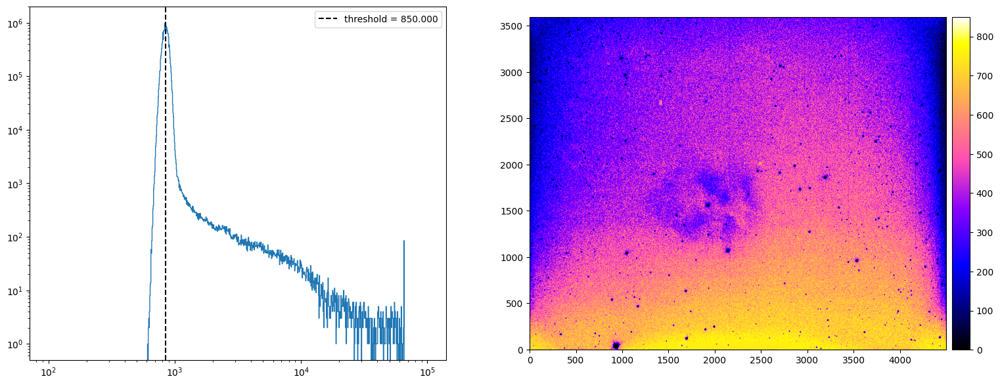

In [11]:
science_Hb_1 = Open_Fits(filepath='Data/IC5146_Hb_1200_062.fit', plot=False)
threshold = 850
fig, axes = Select_Threshold(science_Hb_1, threshold, bins=np.logspace(start=2, stop=5, num=1000))

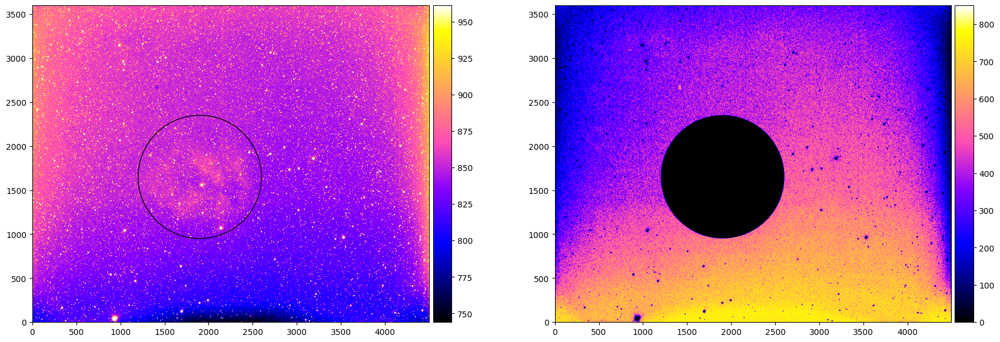

In [12]:
mask_circ = Create_Circular_Mask(science_Hb_1, 3599, 4499, center=(1900, 1650), radius=700, mask=science_Hb_1>threshold)

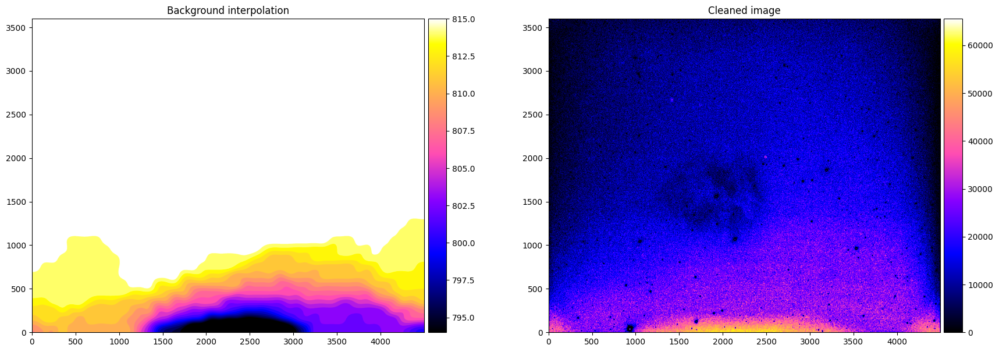

In [13]:
mask = np.logical_or(science_Hb_1 > threshold, mask_circ)
science_Hb_1_cleaned = Remove_Bkg(science_Hb_1, mask, box_size=(100,100), filter_size=(5,5))
science_Hb_1 = []

## Hb 2

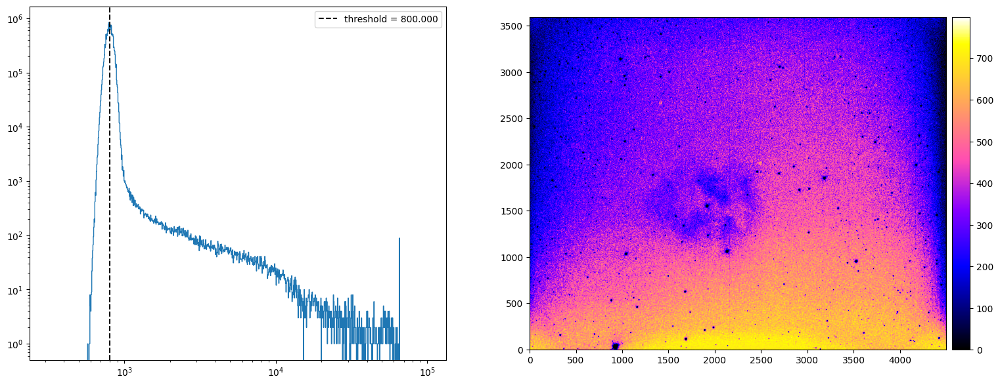

In [14]:
science_Hb_2 = Open_Fits(filepath='Data/IC5146_Hb_1200_063.fit', plot=False)
threshold = 800
fig, axes = Select_Threshold(science_Hb_2, threshold, bins=np.logspace(start=2.5, stop=5, num=1000))

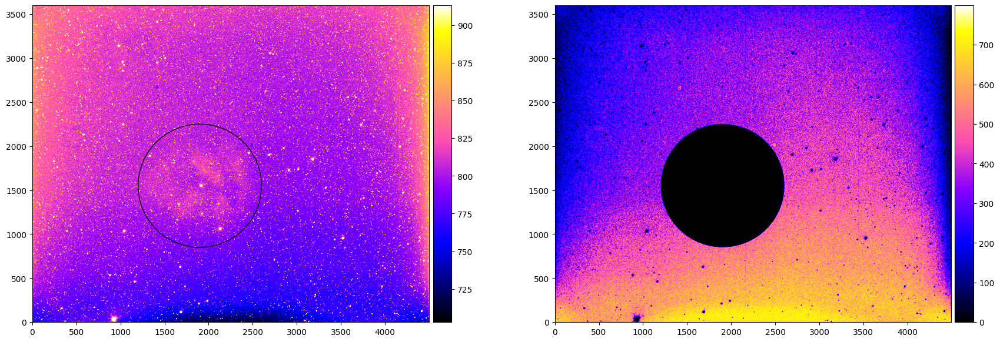

In [15]:
mask_circ = Create_Circular_Mask(science_Hb_2, 3599, 4499, center=(1900, 1550), radius=700, mask=science_Hb_2>threshold)

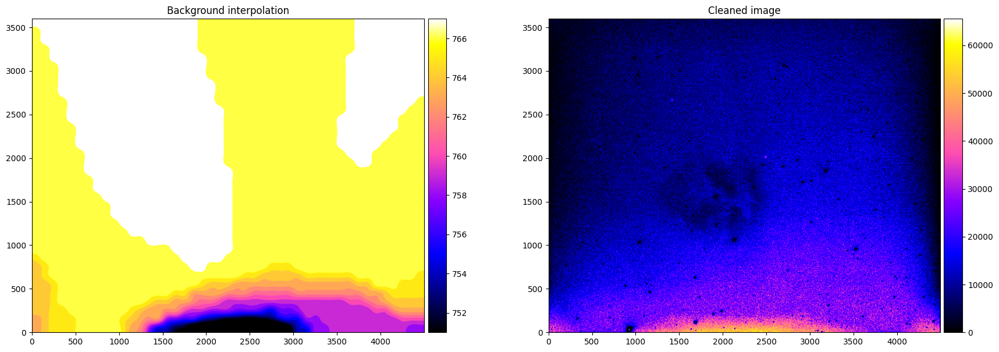

In [16]:
mask = np.logical_or(science_Hb_2 > threshold, mask_circ)
science_Hb_2_cleaned = Remove_Bkg(science_Hb_2, mask, box_size=(100,100), filter_size=(5,5))
science_Hb_2 = []

## Hb 3

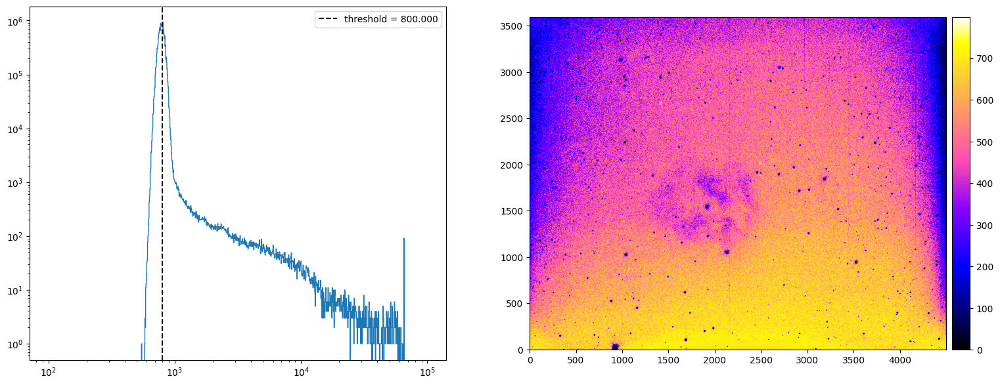

In [17]:
science_Hb_3 = Open_Fits(filepath='Data/IC5146_Hb_1200_064.fit', plot=False)
threshold = 800
fig, axes = Select_Threshold(science_Hb_3, threshold, bins=np.logspace(start=2, stop=5, num=1000))

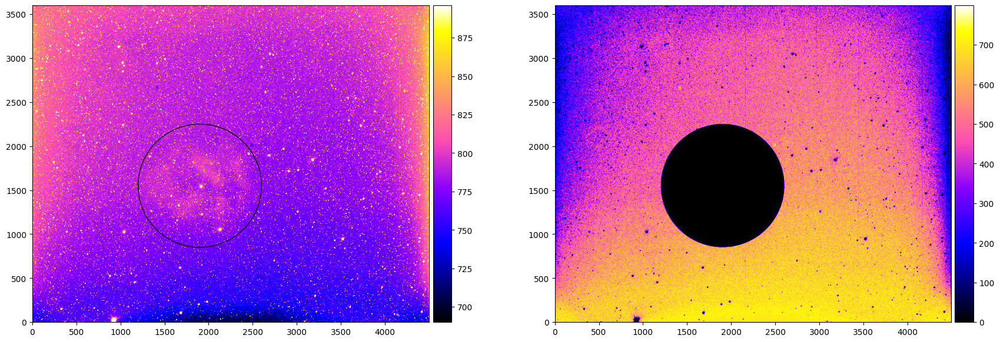

In [18]:
mask_circ = Create_Circular_Mask(science_Hb_3, 3599, 4499, center=(1900, 1550), radius=700, mask=science_Hb_3>threshold)

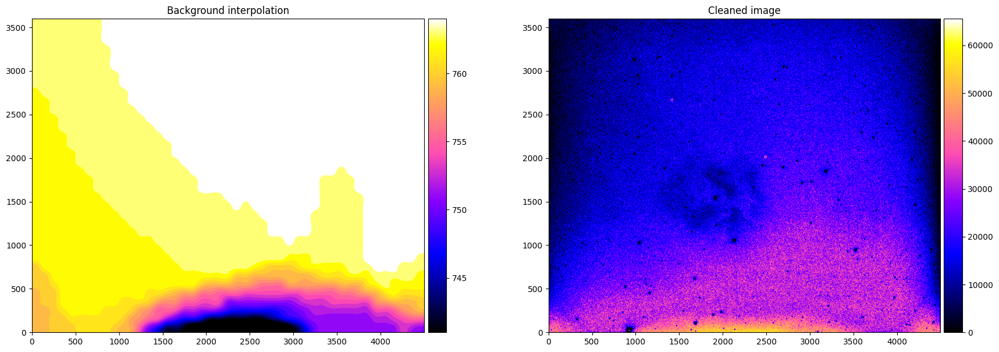

In [19]:
science_Hb_3_cleaned = Remove_Bkg(science_Hb_3, mask, box_size=(100,100), filter_size=(5,5))
science_Hb_3 = []

## Hb 4

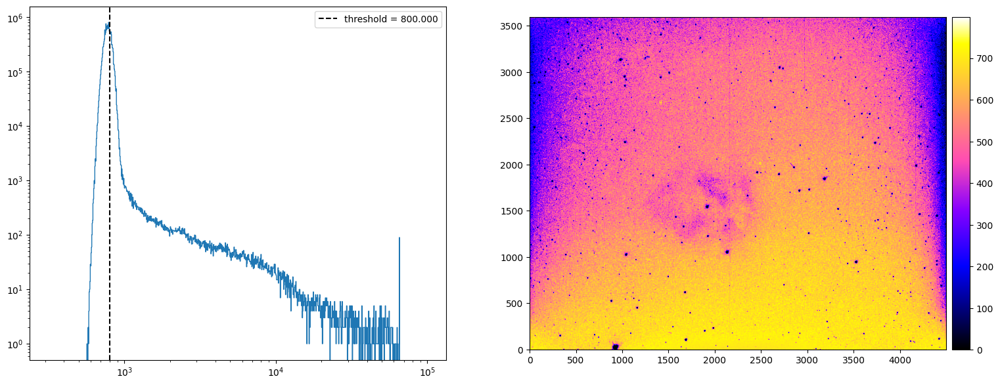

In [20]:
science_Hb_4 = Open_Fits(filepath='Data/IC5146_Hb_1200_065.fit', plot=False)
threshold = 800
fig, axes = Select_Threshold(science_Hb_4, threshold, bins=np.logspace(start=2.5, stop=5, num=1000))

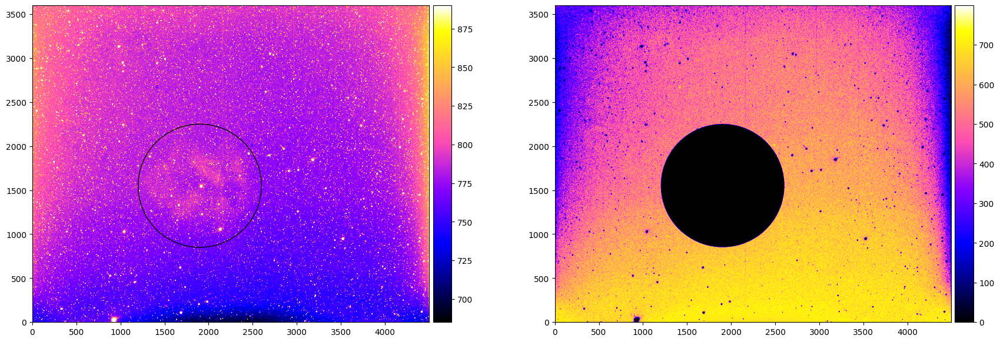

In [21]:
mask_circ = Create_Circular_Mask(science_Hb_4, 3599, 4499, center=(1900, 1550), radius=700, mask=science_Hb_4>threshold)

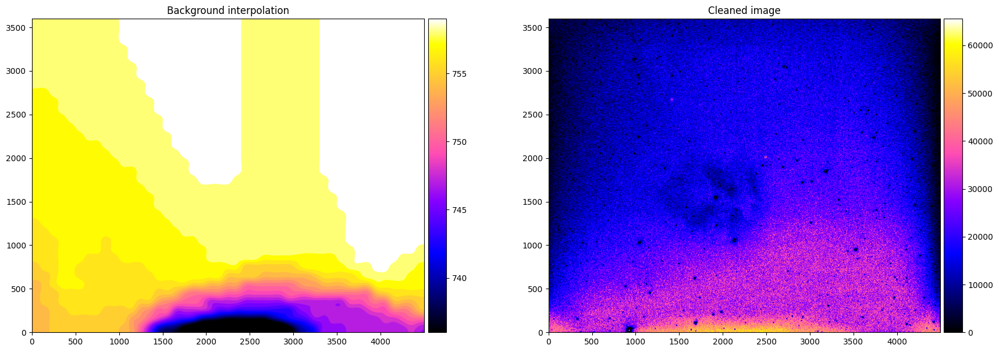

In [22]:
science_Hb_4_cleaned = Remove_Bkg(science_Hb_4, mask, box_size=(100,100), filter_size=(5,5))
science_Hb_4 = []

# 3) Removing dithering

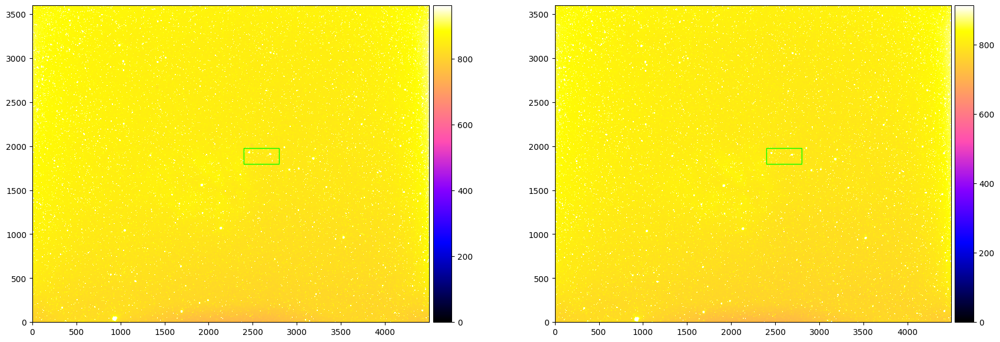

In [23]:
pos = [2400, 1800]
width = 400
height = 180
Create_Rectangle(Open_Fits(filepath='Data/IC5146_Hb_1200_062.fit', plot=False), Open_Fits(filepath='Data/IC5146_Hb_1200_063.fit', plot=False), pos, width, height)

[295.83350019 108.50726394]
[288.40128503 101.33394097]
[287.16860362  92.24985533]
[288.95395143  93.96379727]
x_offesets:  [0 7 9 7]
y_offesets:  [ 0  7 16 15]


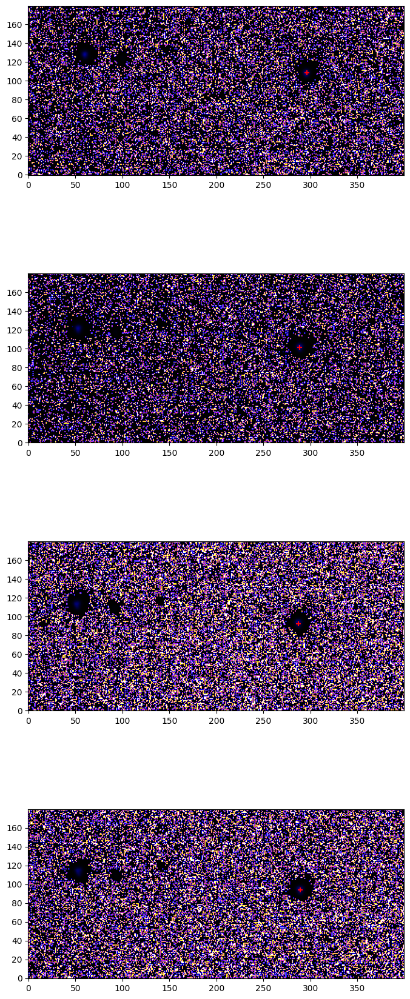

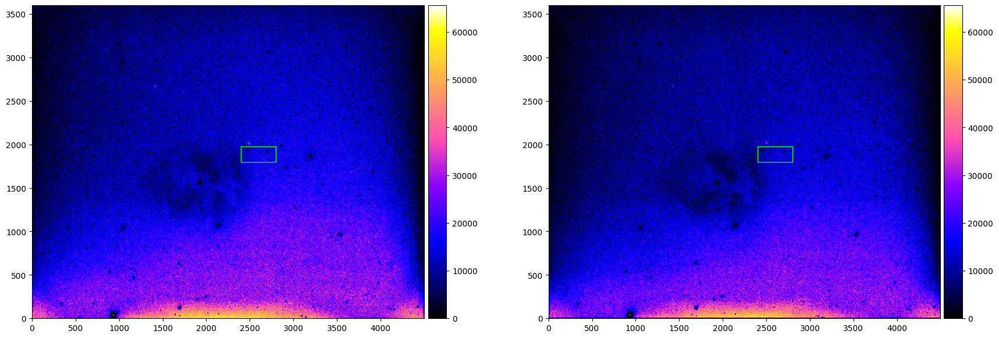

In [24]:
from photutils.centroids import centroid_quadratic

science_Hb = np.array([science_Hb_1_cleaned, science_Hb_2_cleaned, science_Hb_3_cleaned, science_Hb_4_cleaned])
#science_Hb = np.array([Open_Fits(filepath='Data/IC5146_Hb_1200_062.fit', plot=False),Open_Fits(filepath='Data/IC5146_Hb_1200_063.fit', plot=False),Open_Fits(filepath='Data/IC5146_Hb_1200_064.fit', plot=False),Open_Fits(filepath='Data/IC5146_Hb_1200_065.fit', plot=False)])

x_guess = np.array([299, 290, 290, 290])
y_guess = np.array([110, 100, 95, 95])

science_Hb_aligned = Align_Images(science_Hb, pos, width, height, x_guess, y_guess, plot_centroids=True, plot_images=True)
science_Hb = [];

<font color='red'>Ask about saturated pixels<font>

# 4) Stacking the images

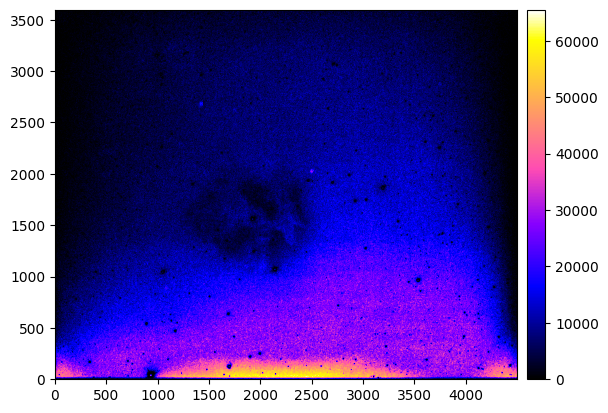

In [25]:
science_Hb_median = np.median(science_Hb_aligned, axis=0)

plt.imshow(science_Hb_median, clim=(0, np.quantile(science_Hb_median, [0.99])), cmap='gnuplot2', origin='lower')
plt.colorbar(fraction=0.0375, pad=0.02);

In [26]:
def weighted_median(values, weights):
    """
    Compute the weighted median of an array of values.
    
    This implementation sorts values and computes the cumulative
    sum of the weights. The weighted median is the smallest value for
    which the cumulative sum is greater than or equal to half of the
    total sum of weights.
    Parameters
    ----------
    values : array-like
        List or array of values on which to calculate the weighted median.
    weights : array-like
        List or array of weights corresponding to the values.
    Returns
    -------
    float
        The weighted median of the input values.
    """
    # Convert input values and weights to numpy arrays
    values = np.array(values)
    weights = np.array(weights)
    
    # Get the indices that would sort the array
    sort_indices = np.argsort(values)
    
    # Sort values and weights according to the sorted indices
    values_sorted = values[sort_indices]
    weights_sorted = weights[sort_indices]  

    # Compute the cumulative sum of the sorted weights
    cumsum = weights_sorted.cumsum()
    
    # Calculate the cutoff as half of the total weight sum
    cutoff = weights_sorted.sum() / 2.
    
    # Return the smallest value for which the cumulative sum is greater
    # than or equal to the cutoff
    return values_sorted[cumsum >= cutoff][0]

![Image not found](https://www.researchgate.net/publication/315458492/figure/fig7/AS:477223028301829@1490790244303/Example-application-of-Weighted-Median-Filters-Ref-de-Rigo-D-2012.png)

In [27]:
# This will take several minutes to run

from tqdm import tqdm

weights = np.array([3, 1, 1, 1, 1])

science_Hb_weighted_median = np.zeros(science_Hb_aligned.shape[1:])

for i in tqdm(range(3599)):
    for j in range(4499):
        science_Hb_weighted_median[i,j] = weighted_median(science_Hb_aligned[:,i,j], weights)

100%|███████████████████████████████████████| 3599/3599 [10:50<00:00,  5.54it/s]


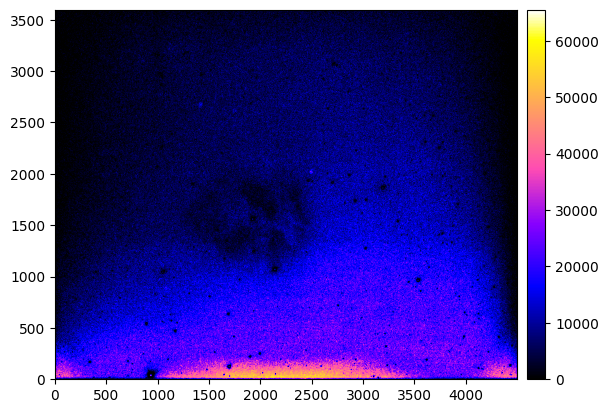

In [28]:
plt.imshow(science_Hb_weighted_median, clim=(0, np.quantile(science_Hb_weighted_median, [0.99])), cmap='gnuplot2', origin='lower')
plt.colorbar(fraction=0.0375, pad=0.02);

In [29]:
"""

science_Hb_rotated_median = np.median(np.array([science_Ha_aligned[0], 
                                              rotate(science_Hb_aligned[1], -0.38, reshape=False), 
                                              rotate(science_Hb_aligned[2], -0.38, reshape=False), 
                                              rotate(science_Hb_aligned[3], -0.38, reshape=False), 
                                              rotate(science_Hb_aligned[3], -0.38, reshape=False)]), axis=0)

plt.imshow(science_Hb_rotated_median, clim=(0, np.quantile(science_Hb_rotated_median, [0.99])), cmap='gnuplot2', origin='lower')
plt.colorbar(fraction=0.0375, pad=0.02);

"""

"\n\nscience_Ha_rotated_median = np.median(np.array([science_Ha_aligned[0], \n                                              rotate(science_Ha_aligned[1], -0.38, reshape=False), \n                                              rotate(science_Ha_aligned[2], -0.38, reshape=False), \n                                              rotate(science_Ha_aligned[3], -0.38, reshape=False), \n                                              rotate(science_Ha_aligned[3], -0.38, reshape=False)]), axis=0)\n\nplt.imshow(science_Ha_rotated_median, clim=(0, np.quantile(science_Ha_rotated_median, [0.99])), cmap='gnuplot2', origin='lower')\nplt.colorbar(fraction=0.0375, pad=0.02);\n\n"

In [ ]:
hdu_out = fits.PrimaryHDU(science_Hb_weighted_median)
hdu_out.writeto('\Data\Hb_complete.fit', overwrite=True)